In [125]:
import pandas as pd

In [126]:
weather = pd.read_csv("local_weather.csv", index_col="DATE")

In [127]:
weather.head()

,STATION,NAME,PRCP,SNWD,TAVG,TMAX,TMIN
DATE,,,,,,,
2000-01-01,FIE00142151,"ESPOO NUPURI, FI",0.08,NaN,NaN,NaN,NaN
2000-01-03,FIE00142151,"ESPOO NUPURI, FI",0.02,NaN,NaN,NaN,NaN
2000-01-04,FIE00142151,"ESPOO NUPURI, FI",0.08,NaN,NaN,NaN,NaN
2000-01-05,FIE00142151,"ESPOO NUPURI, FI",0.00,NaN,NaN,NaN,NaN
2000-01-06,FIE00142151,"ESPOO NUPURI, FI",0.26,NaN,NaN,NaN,NaN


In [128]:
weather.apply(pd.isnull).sum()

STATION         0
NAME            0
PRCP        61542
SNWD       149449
TAVG       135151
TMAX        35392
TMIN        36529
dtype: int64

In [129]:
weather.apply(pd.isnull).sum()/weather.shape[0]

STATION    0.000000
NAME       0.000000
PRCP       0.395118
SNWD       0.959507
TAVG       0.867710
TMAX       0.227227
TMIN       0.234527
dtype: float64

In [130]:
core_weather = weather[["PRCP", "SNWD","TMAX","TMIN"]].copy()

Rename the core values 

In [131]:
core_weather.columns = ["precip", "snow_depth","temp_max","temp_min"]

In [132]:
core_weather

,precip,snow_depth,temp_max,temp_min
DATE,,,,
2000-01-01,0.08,NaN,NaN,NaN
2000-01-03,0.02,NaN,NaN,NaN
2000-01-04,0.08,NaN,NaN,NaN
2000-01-05,0.00,NaN,NaN,NaN
2000-01-06,0.26,NaN,NaN,NaN
...,...,...,...,...
2024-02-25,NaN,NaN,38.0,33.0
2024-02-26,NaN,NaN,35.0,31.0
2024-02-27,NaN,NaN,33.0,28.0


In [133]:
# Calculate the percentage of missing values in each column of core_weather
core_weather.apply(pd.isnull).sum()/core_weather.shape[0]

precip        0.395118
snow_depth    0.959507
temp_max      0.227227
temp_min      0.234527
dtype: float64

In [134]:
# Display the counts of unique values in the "snow_depth" column
core_weather["snow_depth"].value_counts()

0.4     2008
0.8      242
1.6      175
1.2      166
2.4      150
        ... 
30.7       2
31.1       1
31.5       1
31.9       1
32.3       1
Name: snow_depth, Length: 82, dtype: int64

In [135]:
# Remove the "snow_depth" column from the DataFrame
del core_weather["snow_depth"]

In [136]:
# Filter rows with missing values in the "precip" column
core_weather[pd.isnull(core_weather["precip"])]

,precip,temp_max,temp_min
DATE,,,
2005-02-02,NaN,30.0,22.0
2005-02-03,NaN,28.0,22.0
2005-02-04,NaN,29.0,27.0
2005-02-05,NaN,33.0,27.0
2005-02-06,NaN,36.0,33.0
...,...,...,...
2024-02-25,NaN,38.0,33.0
2024-02-26,NaN,35.0,31.0
2024-02-27,NaN,33.0,28.0


In [137]:
start_date = "2005-01-20"
end_date = "2005-02-10"


In [138]:
# Sort the index of core_weather in ascending order
core_weather.sort_index(inplace=True)

In [139]:
# Slice the DataFrame to select rows within the date range
selected_rows = core_weather.loc[start_date:end_date, :]

In [140]:
selected_rows

,precip,temp_max,temp_min
DATE,,,
2005-01-20,NaN,33.0,31.0
2005-01-20,0.32,NaN,NaN
2005-01-20,0.45,32.0,29.0
2005-01-20,NaN,33.0,30.0
2005-01-20,0.36,30.0,28.0
...,...,...,...
2005-02-10,0.28,33.0,20.0
2005-02-10,NaN,34.0,24.0
2005-02-10,0.28,32.0,11.0


In [141]:
# Calculate the average precipitation value
avg_precip = core_weather["precip"].mean()

# Fill missing values in the "precip" column with the average precipitation value
core_weather["precip"].fillna(avg_precip, inplace=True)


In [142]:
core_weather["precip"].value_counts()

0.074163    61542
0.000000    51730
0.010000     4822
0.020000     4367
0.040000     2966
            ...  
2.410000        1
1.750000        1
2.170000        1
1.510000        1
1.640000        1
Name: precip, Length: 196, dtype: int64

In [143]:
core_weather[pd.isnull(core_weather["temp_max"])]

,precip,temp_max,temp_min
DATE,,,
2000-01-01,0.080000,NaN,NaN
2000-01-01,0.070000,NaN,NaN
2000-01-01,0.080000,NaN,NaN
2000-01-01,0.080000,NaN,NaN
2000-01-01,0.060000,NaN,NaN
...,...,...,...
2024-04-05,0.430000,NaN,27.0
2024-04-09,0.074163,NaN,NaN
2024-04-11,0.074163,NaN,41.0


In [144]:
# Filter rows with missing values in the "precip" column
missing_precip_rows = core_weather[core_weather["precip"].isnull()]

# Calculate the average precipitation value and fill missing values
avg_precip = core_weather["precip"].mean()
core_weather["precip"].fillna(avg_precip, inplace=True)

# Forward fill missing values in the DataFrame
core_weather.fillna(core_weather.mean(), inplace=True)

# Convert index to datetime format
core_weather.index = pd.to_datetime(core_weather.index)

# Calculate derived features
core_weather['month_max'] = core_weather['temp_max'].rolling(30).mean()
core_weather['month_day_max'] = core_weather['month_max'] / core_weather['temp_max']
core_weather['max_min'] = core_weather['temp_max'] / core_weather['temp_min']

# Drop NaN values if necessary
core_weather.dropna(inplace=True)

# Assign columns to index
core_weather.index = core_weather.index + pd.DateOffset(days=1)  # Shift index by 1 day to align with your data

# Update predictors list
predictors = ["precip", "temp_max", "temp_min", "month_max", "month_day_max", "max_min"]

# Display the DataFrame and derived features
print(core_weather.head())
print(core_weather.info())

              precip   temp_max   temp_min  month_max  month_day_max   max_min
DATE                                                                          
2000-01-03  0.330000  31.000000  14.000000  36.070316       1.163559  2.214286
2000-01-03  0.220000  33.000000  10.000000  35.536678       1.076869  3.300000
2000-01-03  0.074163  31.000000  27.000000  34.936374       1.126980  1.148148
2000-01-03  0.310000  49.009122  37.655581  35.903345       0.732585  1.301510
2000-01-03  0.300000  49.009122  37.655581  36.503649       0.744834  1.301510
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 155727 entries, 2000-01-03 to 2024-04-20
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   precip         155727 non-null  float64
 1   temp_max       155727 non-null  float64
 2   temp_min       155727 non-null  float64
 3   month_max      155727 non-null  float64
 4   month_day_max  155727 non-null  float64
 5   m

In [145]:
# Sort the index of core_weather in ascending order
core_weather.sort_index(inplace=True)

# Forward fill missing values in core_weather DataFrame
core_weather.fillna(core_weather.mean(), inplace=True)


In [146]:
missing_values_temp_max = core_weather[core_weather['temp_max'].isnull()]
missing_values_temp_min = core_weather[core_weather['temp_min'].isnull()]

In [147]:
core_weather.apply(pd.isnull).sum()/core_weather.shape[0]

precip           0.0
temp_max         0.0
temp_min         0.0
month_max        0.0
month_day_max    0.0
max_min          0.0
dtype: float64

In [148]:
core_weather.dtypes

precip           float64
temp_max         float64
temp_min         float64
month_max        float64
month_day_max    float64
max_min          float64
dtype: object

In [149]:
core_weather.index

DatetimeIndex(['2000-01-03', '2000-01-03', '2000-01-03', '2000-01-03',
               '2000-01-03', '2000-01-03', '2000-01-03', '2000-01-03',
               '2000-01-03', '2000-01-03',
               ...
               '2024-04-17', '2024-04-18', '2024-04-18', '2024-04-18',
               '2024-04-19', '2024-04-19', '2024-04-19', '2024-04-20',
               '2024-04-20', '2024-04-20'],
              dtype='datetime64[ns]', name='DATE', length=155727, freq=None)

In [150]:
core_weather.index = pd.to_datetime(core_weather.index)

In [151]:
core_weather.index

DatetimeIndex(['2000-01-03', '2000-01-03', '2000-01-03', '2000-01-03',
               '2000-01-03', '2000-01-03', '2000-01-03', '2000-01-03',
               '2000-01-03', '2000-01-03',
               ...
               '2024-04-17', '2024-04-18', '2024-04-18', '2024-04-18',
               '2024-04-19', '2024-04-19', '2024-04-19', '2024-04-20',
               '2024-04-20', '2024-04-20'],
              dtype='datetime64[ns]', name='DATE', length=155727, freq=None)

In [152]:
core_weather.apply(lambda x : (x==9999).sum())

precip           0
temp_max         0
temp_min         0
month_max        0
month_day_max    0
max_min          0
dtype: int64

<AxesSubplot:xlabel='DATE'>

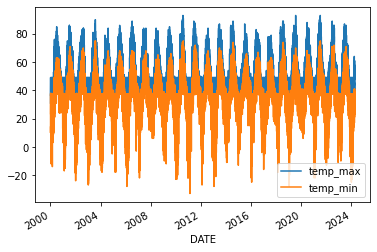

In [153]:
# analyze the weather data

core_weather[["temp_max", "temp_min"]].plot()

<AxesSubplot:xlabel='DATE'>

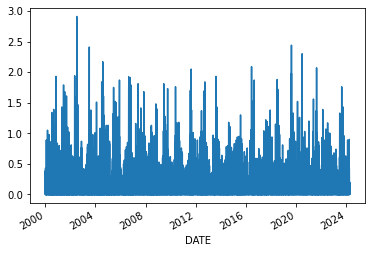

In [154]:
core_weather["precip"].plot()

In [155]:
core_weather["target"] = core_weather.shift(-1)["temp_max"]

In [156]:
core_weather

,precip,temp_max,temp_min,month_max,month_day_max,max_min,target
DATE,,,,,,,
2000-01-03,0.330000,31.000000,14.000000,36.070316,1.163559,2.214286,33.000000
2000-01-03,0.220000,33.000000,10.000000,35.536678,1.076869,3.300000,31.000000
2000-01-03,0.074163,31.000000,27.000000,34.936374,1.126980,1.148148,49.009122
2000-01-03,0.310000,49.009122,37.655581,35.903345,0.732585,1.301510,49.009122
2000-01-03,0.300000,49.009122,37.655581,36.503649,0.744834,1.301510,31.000000
...,...,...,...,...,...,...,...
2024-04-19,0.000000,39.000000,37.655581,49.801216,1.276954,1.035703,41.000000
2024-04-19,0.074163,41.000000,28.000000,49.301216,1.202469,1.464286,36.000000
2024-04-20,0.020000,36.000000,23.000000,48.501216,1.347256,1.565217,33.000000


In [157]:
core_weather = core_weather.iloc[:-1,:].copy()

In [158]:
core_weather

,precip,temp_max,temp_min,month_max,month_day_max,max_min,target
DATE,,,,,,,
2000-01-03,0.330000,31.000000,14.000000,36.070316,1.163559,2.214286,33.000000
2000-01-03,0.220000,33.000000,10.000000,35.536678,1.076869,3.300000,31.000000
2000-01-03,0.074163,31.000000,27.000000,34.936374,1.126980,1.148148,49.009122
2000-01-03,0.310000,49.009122,37.655581,35.903345,0.732585,1.301510,49.009122
2000-01-03,0.300000,49.009122,37.655581,36.503649,0.744834,1.301510,31.000000
...,...,...,...,...,...,...,...
2024-04-19,0.000000,36.000000,30.000000,50.434550,1.400960,1.200000,39.000000
2024-04-19,0.000000,39.000000,37.655581,49.801216,1.276954,1.035703,41.000000
2024-04-19,0.074163,41.000000,28.000000,49.301216,1.202469,1.464286,36.000000


In [159]:
core_weather = core_weather.iloc[30:,:].copy()

In [160]:
core_weather["month_max"] = core_weather["temp_max"].rolling(30).mean()

In [161]:
# Impute non-finite values in 'month_day_max' and 'max_min' columns with mean
core_weather['month_day_max'].fillna(core_weather['month_day_max'].mean(), inplace=True)
core_weather['max_min'].fillna(core_weather['max_min'].mean(), inplace=True)


In [162]:
core_weather["monthly_avg"]= core_weather["temp_max"].groupby(core_weather.index.month).apply(lambda x: x.expanding(1).mean())

In [163]:
core_weather

,precip,temp_max,temp_min,month_max,month_day_max,max_min,target,monthly_avg
DATE,,,,,,,,
2000-01-05,0.074163,37.000000,32.000000,NaN,1.085701,1.156250,49.009122,37.000000
2000-01-05,0.060000,49.009122,37.655581,NaN,0.830551,1.301510,38.000000,43.004561
2000-01-05,0.074163,38.000000,32.000000,NaN,1.077313,1.187500,35.000000,41.336374
2000-01-05,0.070000,35.000000,29.000000,NaN,1.156312,1.206897,36.000000,39.752281
2000-01-05,0.080000,36.000000,30.000000,NaN,1.112147,1.200000,38.000000,39.001824
...,...,...,...,...,...,...,...,...
2024-04-19,0.000000,36.000000,30.000000,50.434550,1.400960,1.200000,39.000000,46.864072
2024-04-19,0.000000,39.000000,37.655581,49.801216,1.276954,1.035703,41.000000,46.863458
2024-04-19,0.074163,41.000000,28.000000,49.301216,1.202469,1.464286,36.000000,46.863001


In [191]:
core_weather = core_weather.iloc[30:,:].copy()

In [192]:
# Handle missing values
core_weather.fillna(weather.mean(), inplace=True)

# Handle infinite values
core_weather.replace([np.inf, -np.inf], np.nan, inplace=True)
core_weather.dropna(inplace=True)

C:\Users\abdul\AppData\Local\Temp\ipykernel_19900\474594683.py:2: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



In [165]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split


reg = Ridge(alpha = .1)

In [166]:
# Assuming core_weather is your DataFrame with datetime index
# Sort the index in ascending order
core_weather.sort_index(inplace=True)

# Define the proportion of data for training (e.g., 80%)
train_size = 0.8

# Determine the index position to split the data
split_index = int(len(core_weather) * train_size)

# Split the data into training and testing sets
train_data = core_weather.iloc[:split_index]
test_data = core_weather.iloc[split_index:]

# Alternatively, you can use train_test_split from sklearn
# train_data, test_data = train_test_split(core_weather, train_size=train_size, shuffle=False)

# Print the shapes of the training and testing sets
print("Training set shape:", train_data.shape)
print("Testing set shape:", test_data.shape)
 

Training set shape: (124282, 8)
Testing set shape: (31071, 8)


In [167]:
reg.fit(train_data[predictors], train_data["target"])

Ridge(alpha=0.1)

In [168]:
predictions = reg.predict(test_data[predictors])

In [193]:
predictions

array([68.21087114, 68.59802914, 69.22127541, ..., 49.16148928,
       48.25958811, 46.96274855])

In [169]:
from sklearn.metrics import mean_absolute_error 

In [170]:
mean_absolute_error(test_data["target"], predictions)

4.32178130452321

In [171]:
combined = pd.concat([test_data["target"], pd.Series(predictions, index = test_data.index)], axis= 1)

combined.columns = ["actual", "predictions"]

In [172]:
combined

,actual,predictions
DATE,,
2018-06-13,70.0,68.210871
2018-06-13,67.0,68.598029
2018-06-14,68.0,69.221275
2018-06-14,68.0,70.164098
2018-06-14,63.0,69.341191
...,...,...
2024-04-19,39.0,49.819718
2024-04-19,41.0,49.122012
2024-04-19,36.0,49.161489


<AxesSubplot:xlabel='DATE'>

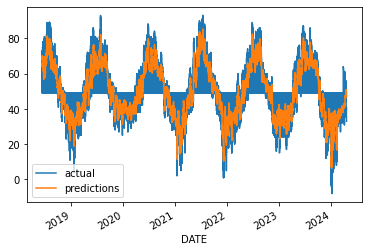

In [173]:
combined.plot()

In [174]:
reg.coef_

array([-0.01211446,  0.05706028, -0.0392937 ,  0.95910878, -0.32437923,
        0.00523739])

In [175]:
def create_predictions(predictors, core_weather, reg):
    # Define the proportion of data for training (e.g., 80%)
    train_size = 0.8
    split_index = int(len(core_weather) * train_size)
    train_data = core_weather.iloc[:split_index]
    test_data = core_weather.iloc[split_index:]
    reg.fit(train_data[predictors], train_data["target"])
    predictions = reg.predict(test_data[predictors])
    error = mean_absolute_error(test_data["target"], predictions)
    combined = pd.concat([test_data["target"], pd.Series(predictions, index = test_data.index)], axis= 1)
    combined.columns = ["actual", "predictions"]
    return error, combined

    

In [176]:
core_weather = core_weather.iloc[30:,:].copy()

In [177]:
import numpy as np
np.isfinite(core_weather).all()


precip           True
temp_max         True
temp_min         True
month_max        True
month_day_max    True
max_min          True
target           True
monthly_avg      True
dtype: bool

<AxesSubplot:xlabel='DATE'>

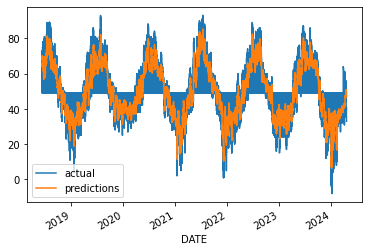

In [178]:
combined.plot()

In [179]:
# Identify rows with non-finite values in 'month_day_max' and 'max_min' columns
rows_with_nonfinite_values = core_weather[~np.isfinite(core_weather['month_day_max']) | ~np.isfinite(core_weather['max_min'])]

# Print the rows with non-finite values
print(rows_with_nonfinite_values)


Empty DataFrame
Columns: [precip, temp_max, temp_min, month_max, month_day_max, max_min, target, monthly_avg]
Index: []


In [180]:
core_weather["monthly_avg"]= core_weather["temp_max"].groupby(core_weather.index.month).apply(lambda x: x.expanding(1).mean())

In [181]:
core_weather

,precip,temp_max,temp_min,month_max,month_day_max,max_min,target,monthly_avg
DATE,,,,,,,,
2000-01-07,0.170000,37.000000,26.000000,43.004561,1.162285,1.423077,38.000000,37.000000
2000-01-08,0.074163,38.000000,33.000000,43.037894,1.132576,1.151515,49.009122,37.500000
2000-01-08,0.000000,49.009122,37.655581,43.404865,0.885649,1.301510,49.009122,41.336374
2000-01-08,0.010000,49.009122,37.655581,43.404865,0.885649,1.301510,38.000000,43.254561
2000-01-08,0.010000,38.000000,34.000000,43.037894,1.132576,1.117647,49.009122,42.203649
...,...,...,...,...,...,...,...,...
2024-04-19,0.000000,36.000000,30.000000,50.434550,1.400960,1.200000,39.000000,46.864072
2024-04-19,0.000000,39.000000,37.655581,49.801216,1.276954,1.035703,41.000000,46.863458
2024-04-19,0.074163,41.000000,28.000000,49.301216,1.202469,1.464286,36.000000,46.863001


ADF Statistic: -8.948585991761952
p-value: 8.849504910303586e-15


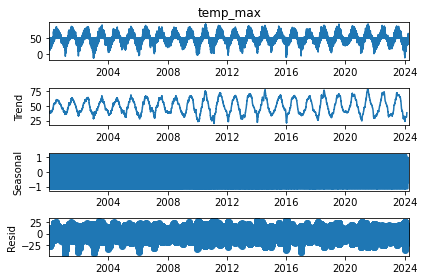

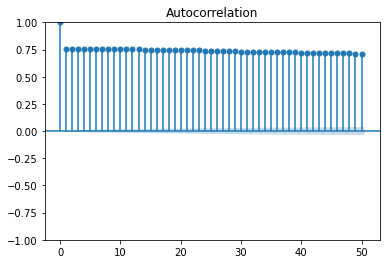

In [182]:
# Seasonal decomposition
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(core_weather['temp_max'], period=365)
decomposition.plot()

# Autocorrelation plot
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(core_weather['temp_max'], lags=50)

# Augmented Dickey-Fuller test for stationarity
from statsmodels.tsa.stattools import adfuller
result = adfuller(core_weather['temp_max'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])


In [183]:

from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectFromModel

# Initialize Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Feature selection using Random Forest
selector = SelectFromModel(rf_model)
selector.fit(train_data[predictors], train_data["target"])

# Get selected features
selected_features = train_data[predictors].columns[selector.get_support()]


In [184]:
print("Selected Features:", selected_features)


Selected Features: Index(['month_max'], dtype='object')


In [185]:
# Use selected features for modeling
X_train_selected = train_data[selected_features]
y_train = train_data["target"]

# Now X_train_selected contains only the selected features
# You can use it for training your model


In [186]:
from sklearn.model_selection import GridSearchCV

# Define hyperparameters grid
param_grid = {
    'alpha': [0.1, 1.0, 10.0],
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=Ridge(), param_grid=param_grid, cv=5)

# Perform grid search
grid_search.fit(train_data[predictors], train_data["target"])

# Get best hyperparameters
best_params = grid_search.best_params_


In [187]:
# Perform grid search
grid_search.fit(train_data[predictors], train_data["target"])

# Get best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Get best estimator
best_estimator = grid_search.best_estimator_
print("Best Estimator:", best_estimator)

# Get best score
best_score = grid_search.best_score_
print("Best Score:", best_score)

# Get results
results = grid_search.cv_results_
print("Grid Search Results:", results)


Best Hyperparameters: {'alpha': 1.0, 'solver': 'saga'}
Best Estimator: Ridge(solver='saga')
Best Score: 0.6847434943610665
Grid Search Results: {'mean_fit_time': array([0.01408949, 0.0165359 , 0.01380658, 0.01764112, 0.01126266,
       0.36983738, 0.46064758, 0.01279616, 0.01913991, 0.01164393,
       0.0160933 , 0.01174026, 0.30787511, 0.37847161, 0.01433468,
       0.01733313, 0.00843782, 0.01371937, 0.01086988, 0.34052954,
       0.31872635]), 'std_fit_time': array([0.0044121 , 0.00347504, 0.00338895, 0.00294415, 0.0028371 ,
       0.04858585, 0.13395515, 0.00359395, 0.00260689, 0.00211688,
       0.00279115, 0.00268687, 0.04343952, 0.14451851, 0.00277244,
       0.00254072, 0.00310378, 0.00401131, 0.00088335, 0.08163112,
       0.14803087]), 'mean_score_time': array([0.00120735, 0.00161338, 0.00172362, 0.00139031, 0.00130625,
       0.00285468, 0.00121636, 0.00274701, 0.00170059, 0.00278878,
       0.00543089, 0.00216227, 0.0004086 , 0.00132246, 0.0006855 ,
       0.00065861, 0.002

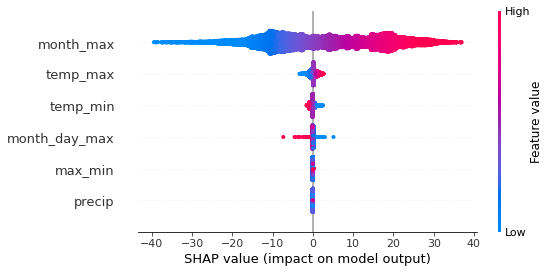

In [188]:
import shap

# Initialize SHAP explainer
explainer = shap.Explainer(reg, train_data[predictors])

# Calculate SHAP values
shap_values = explainer.shap_values(test_data[predictors])

# Visualize SHAP summary plot
shap.summary_plot(shap_values, test_data[predictors])


In [189]:
from sklearn.ensemble import GradientBoostingRegressor

# Initialize Gradient Boosting model
gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)

# Fit the model
gb_model.fit(train_data[predictors], train_data["target"])

# Predictions
gb_predictions = gb_model.predict(test_data[predictors])


In [190]:
import plotly.express as px

# Plotly line plot
fig = px.line(core_weather, x=core_weather.index, y='temp_max in F', title='Max Temperature Over Time')
fig.show()
